## Identifying prospective customers from Census Data

# Bussiness Problem

**Nowadays it is taboo to reveal how much you make. While the social economic repercussions of this problem are a discussion of its own, a secondary problem this creates is that credit card companies that have income as a vital metric for offering them specific credit plans have a hard time pinning down who they need to market their high-end plans to.**

**To compensate for this problem, we have come up with a machine learning algorithm that can predict if a certain demographic earns more than or less than a given income standard based on data that can be gained through publicly available information like the census.**

In [0]:
sc = spark.sparkContext

In [0]:
sc.setLogLevel("ERROR")

## Loading the dataset

In [0]:
df = spark.read.csv('/FileStore/tables/Data.csv', header=True, inferSchema=True)

## Cleaning the dataset

In [0]:
from pyspark.sql.functions import col, regexp_replace
# Replace spaces with underscores in column names
new_col_names = [col_name.strip().replace('-', '_') for col_name in df.columns]
for i, col_name in enumerate(df.columns):
    df = df.withColumnRenamed(col_name, new_col_names[i])

In [0]:
from pyspark.sql.functions import col, when

valueWhenTrue = None  # for example

for c in df.columns:
    df = df.withColumn(
        c,
        when(
            col(c) == ' ?',
            valueWhenTrue
        ).otherwise(col(c))
    )


In [0]:
from pyspark.sql.functions import col, sum
null_counts = df.agg(*[sum(col(c).isNull().cast('int')).alias(c) for c in df.columns])
null_counts.show()

+---+---------+------+---------+-------------+--------------+----------+------------+----+---+------------+------------+--------------+--------------+------+
|Age|Workclass|fnlwgt|Education|Education_Num|Marital_Status|Occupation|Relationship|Race|Sex|Capital_Gain|Capital_Loss|Hours_Per_Week|Native_Country|Target|
+---+---------+------+---------+-------------+--------------+----------+------------+----+---+------------+------------+--------------+--------------+------+
|  0|     2799|     0|        0|            0|             0|      2809|           0|   0|  0|           0|           0|             0|           857|     0|
+---+---------+------+---------+-------------+--------------+----------+------------+----+---+------------+------------+--------------+--------------+------+



In [0]:
df = df.dropna()

In [0]:
from pyspark.sql.functions import col, sum
null_counts = df.agg(*[sum(col(c).isNull().cast('int')).alias(c) for c in df.columns])
null_counts.show()

+---+---------+------+---------+-------------+--------------+----------+------------+----+---+------------+------------+--------------+--------------+------+
|Age|Workclass|fnlwgt|Education|Education_Num|Marital_Status|Occupation|Relationship|Race|Sex|Capital_Gain|Capital_Loss|Hours_Per_Week|Native_Country|Target|
+---+---------+------+---------+-------------+--------------+----------+------------+----+---+------------+------------+--------------+--------------+------+
|  0|        0|     0|        0|            0|             0|         0|           0|   0|  0|           0|           0|             0|             0|     0|
+---+---------+------+---------+-------------+--------------+----------+------------+----+---+------------+------------+--------------+--------------+------+



In [0]:
df = df.dropDuplicates()

In [0]:
df.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- Workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- Education: string (nullable = true)
 |-- Education_Num: integer (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- Relationship: string (nullable = true)
 |-- Race: string (nullable = true)
 |-- Sex: string (nullable = true)
 |-- Capital_Gain: integer (nullable = true)
 |-- Capital_Loss: integer (nullable = true)
 |-- Hours_Per_Week: integer (nullable = true)
 |-- Native_Country: string (nullable = true)
 |-- Target: string (nullable = true)



In [0]:
tables = spark.sql("show tables").show()

+--------+------------+-----------+
|database|   tableName|isTemporary|
+--------+------------+-----------+
|        |income_table|       true|
+--------+------------+-----------+



In [0]:
spark.catalog.listTables()

Out[406]: [Table(name='income_table', catalog=None, namespace=[], description=None, tableType='TEMPORARY', isTemporary=True)]

In [0]:
df.createOrReplaceTempView("income_table")

In [0]:
# df.write.saveAsTable("income_table_per")

In [0]:
tables = spark.sql("show tables").show()

+--------+------------+-----------+
|database|   tableName|isTemporary|
+--------+------------+-----------+
|        |income_table|       true|
+--------+------------+-----------+



# Exploring The Data

The query you provided calculates the proportion of males in the income_table dataset. It divides the count of males by the count of all records in the dataset, and returns the result as a single column table. From this, we can identify that their is a **disproportunate bias favoring Men** when it comes to earning more than $50,000 per annum when compared to women./

In [0]:
query = """
SELECT 
(COUNT(CASE WHEN TRIM(sex) = 'Male' THEN 1 END) / COUNT(*)) AS male_proportion 
FROM income_table
WHERE TRIM(target)='>50K'
"""
result1 = spark.sql(query)
result1.show(5)

+-----------------+
|  male_proportion|
+-----------------+
|0.851008748437779|
+-----------------+



In [0]:
query2 = """
SELECT 
Education_Num, count(*) AS cn
FROM income_table 
GROUP BY Education_Num 
SORT BY Education_Num
"""
result2 = spark.sql(query2)
result2.show()

+-------------+-----+
|Education_Num|   cn|
+-------------+-----+
|            1|   70|
|            2|  220|
|            3|  447|
|            4|  822|
|            5|  676|
|            6| 1223|
|            7| 1619|
|            8|  575|
|            9|14770|
|           10| 9887|
|           11| 1958|
|           12| 1507|
|           13| 7559|
|           14| 2513|
|           15|  785|
|           16|  544|
+-------------+-----+



In [0]:
query3 = """
SELECT target, COUNT(*) as target_count
FROM income_table 
GROUP BY Target
"""
result3 = spark.sql(query3)
result3.show()

+------+------------+
|target|target_count|
+------+------------+
|  >50K|       11202|
| <=50K|       33973|
+------+------------+



The data has been loaded. Then temporary and persistant tables have been created.  Following this, we have run SQL Queries to explore the data.

In [0]:
df.columns

Out[413]: ['Age',
 'Workclass',
 'fnlwgt',
 'Education',
 'Education_Num',
 'Marital_Status',
 'Occupation',
 'Relationship',
 'Race',
 'Sex',
 'Capital_Gain',
 'Capital_Loss',
 'Hours_Per_Week',
 'Native_Country',
 'Target']

In [0]:
df.select(["Target"]).collect()

Out[414]: [Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Target=' >50K'),
 Row(Target=' <=50K'),
 Row(Target=' <=50K'),
 Row(Targe

In [0]:
from pyspark.sql.functions import when
df=df.withColumn("Target", when(df["Target"]==' <=50K',0).otherwise(1))

In [0]:
df.show()

+---+-----------------+------+-------------+-------------+--------------------+------------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
|Age|        Workclass|fnlwgt|    Education|Education_Num|      Marital_Status|        Occupation|  Relationship|               Race|    Sex|Capital_Gain|Capital_Loss|Hours_Per_Week|Native_Country|Target|
+---+-----------------+------+-------------+-------------+--------------------+------------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
| 40|          Private|193524|    Doctorate|           16|  Married-civ-spouse|    Prof-specialty|       Husband|              White|   Male|           0|           0|            60| United-States|     1|
| 43| Self-emp-not-inc|292175|      Masters|           14|            Divorced|   Exec-managerial|     Unmarried|              White| Female|           0|           0|            4

In [0]:
df.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- Workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- Education: string (nullable = true)
 |-- Education_Num: integer (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- Relationship: string (nullable = true)
 |-- Race: string (nullable = true)
 |-- Sex: string (nullable = true)
 |-- Capital_Gain: integer (nullable = true)
 |-- Capital_Loss: integer (nullable = true)
 |-- Hours_Per_Week: integer (nullable = true)
 |-- Native_Country: string (nullable = true)
 |-- Target: integer (nullable = false)



## Data Balancing

In [0]:
from pyspark.sql.functions import explode, when, col, array, lit

major_df = df.filter(col("Target") == 0)
minor_df = df.filter(col("Target") == 1)

# Compute the oversampling ratio
ratio = int(major_df.count() / minor_df.count())

# Duplicate the minority rows
oversampled_df = minor_df.withColumn("dummy", explode(array([lit(x) for x in range(ratio)]))).drop('dummy')

# Combine both oversampled minority rows and previous majority rows
combined_df = major_df.unionAll(oversampled_df)

combined_df.show()



+---+-----------------+------+-----------+-------------+--------------------+------------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
|Age|        Workclass|fnlwgt|  Education|Education_Num|      Marital_Status|        Occupation|  Relationship|               Race|    Sex|Capital_Gain|Capital_Loss|Hours_Per_Week|Native_Country|Target|
+---+-----------------+------+-----------+-------------+--------------------+------------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
| 28|          Private|338409|  Bachelors|           13|  Married-civ-spouse|    Prof-specialty|          Wife|              Black| Female|           0|           0|            40|          Cuba|     0|
| 32|          Private|186824|    HS-grad|            9|       Never-married| Machine-op-inspct|     Unmarried|              White|   Male|           0|           0|            40| United-

Since, the data is not balanced with respect to the target variable, we have performed the oversampling on the data to avoid the discrepancy between observations for the target.

In [0]:
from pyspark.sql.functions import count

combined_df.groupBy('Target').agg(count('*').alias('target_count')).show()


+------+------------+
|Target|target_count|
+------+------------+
|     0|       33973|
|     1|       33606|
+------+------------+



## Splitting the data

In [0]:
train_data,test_data=combined_df.randomSplit([0.7,0.3])

In [0]:
from pyspark.ml.feature import StringIndexer
# Use StringIndexer to convert the categorical columns to hold numerical data
 
Workclass_indexer = StringIndexer(inputCol='Workclass',outputCol='Workclass_index',handleInvalid='keep')
Education_indexer = StringIndexer(inputCol='Education',outputCol='Education_index',handleInvalid='keep')
Marital_Status_indexer = StringIndexer(inputCol='Marital_Status',outputCol='Marital_Status_index',handleInvalid='keep')
Occupation_indexer = StringIndexer(inputCol='Occupation',outputCol='Occupation_index',handleInvalid='keep')
Race_indexer = StringIndexer(inputCol='Race',outputCol='Race_index',handleInvalid='keep')
Relationship_indexer = StringIndexer(inputCol='Relationship',outputCol='Relationship_index',handleInvalid='keep')
Sex_indexer = StringIndexer(inputCol='Sex',outputCol='Sex_index',handleInvalid='keep')
Native_Country_indexer = StringIndexer(inputCol='Native_Country',outputCol='Native_Country_index',handleInvalid='keep')

## Logistic Regression

In [0]:
recall_values=[]

In [0]:
# Import the required libraries
 
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.feature import VectorAssembler,StringIndexer ,OneHotEncoder
from pyspark.ml import Pipeline

In [0]:
data_encoder = OneHotEncoder(
    inputCols=[
        "Workclass_index",
        "Education_index",
        "Marital_Status_index",
        "Occupation_index",
        "Relationship_index",
        "Race_index",
        "Sex_index",
        "Native_Country_index"
    ], 
    outputCols= [
          "Workclass_vec",
        "Education_vec",
        "Marital_Status_vec",
        "Occupation_vec",
        "Relationship_vec",
        "Race_vec",
        "Sex_vec",
        "Native_Country_vec"],
    handleInvalid='keep'
)

In [0]:
assembler = VectorAssembler(
    inputCols=[
       "Age",
        "Workclass_vec",
        "Education_vec",
        "Marital_Status_vec",
        "Occupation_vec",
        "Relationship_vec",
        "Race_vec",
        "Sex_vec",
        "Capital_Gain",
        "Capital_Loss",
        "Hours_Per_Week",
        "Native_Country_vec"
        ],
    outputCol="features"
)

Create an object for the Logistic Regression model

In [0]:
lr_model = LogisticRegression(labelCol='Target')

In [0]:
pipe = Pipeline(
    stages=[
        Workclass_indexer,
Education_indexer,
Marital_Status_indexer,
Occupation_indexer,
Race_indexer,
Relationship_indexer,
Sex_indexer,
Native_Country_indexer,
        data_encoder,
    assembler,
        lr_model
    ]
)

In [0]:
%time
# run the pipeline
fit_model=pipe.fit(train_data)



CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


In [0]:
# Store the results in a dataframe
results = fit_model.transform(test_data)

In [0]:
results.select(['Target','prediction']).show()

+------+----------+
|Target|prediction|
+------+----------+
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
+------+----------+
only showing top 20 rows



## Model Evaluation

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
def evaluate(results,Target,model_name):
    

    AUC_evaluator = BinaryClassificationEvaluator(rawPredictionCol='prediction',labelCol='Target',metricName='areaUnderROC')
    AUC = AUC_evaluator.evaluate(results)

    print(f"The area under the curve is {AUC:.2f} for model {model_name}")

    PR_evaluator = BinaryClassificationEvaluator(rawPredictionCol='prediction',labelCol='Target',metricName='areaUnderPR')
    PR = PR_evaluator.evaluate(results)

    print("The area under the PR curve is {} for model {}".format(PR,model_name))



    ACC_evaluator = MulticlassClassificationEvaluator(
    labelCol="Target", predictionCol="prediction", metricName="accuracy")

    accuracy = ACC_evaluator.evaluate(results)

    print("The accuracy of the model is {} for model {}".format(accuracy,model_name))



    y_true = results.select("Target")
    y_true = y_true.toPandas()
 
    y_pred = results.select("prediction")
    y_pred = y_pred.toPandas()
 
    cnf_matrix = confusion_matrix(y_true, y_pred)
    print("Below is the confusion matrix: \n {}".format(cnf_matrix))

    tn = cnf_matrix[0][0]
    fp = cnf_matrix[0][1]
    fn = cnf_matrix[1][0]
    tp = cnf_matrix[1][1]
    
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    # Compute confusion matrix
    y_true = results.select("Target")
    y_true = y_true.toPandas()
    y_pred = results.select("prediction")
    y_pred = y_pred.toPandas()
    cnf_matrix = confusion_matrix(y_true, y_pred)

    # Plot confusion matrix heatmap
    class_names = ['Negative', 'Positive']
    df_cm = pd.DataFrame(cnf_matrix, index=class_names, columns=class_names)
    fig, ax = plt.subplots(figsize=(5,5))
    sns.heatmap(df_cm, annot=True, cmap='Blues', fmt='g', ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_title(f'Confusion Matrix for {model_name}')
    
    
    f1_score = 2*(precision*recall)/(precision+recall)
    print(f"Accuracy: {accuracy:.2f} for model {model_name}")
    print(f"Precision: {precision:.2f} for model {model_name}")
    print(f"Recall: {recall:.2f} for model {model_name}")
    print(f"F1 Score: {f1_score:.2f} for model {model_name}")
    plt.show()
    return recall
    

The area under the curve is 0.82 for model Logistic Model
The area under the PR curve is 0.7808615555164609 for model Logistic Model
The accuracy of the model is 0.820675105485232 for model Logistic Model
Below is the confusion matrix: 
 [[8202 2063]
 [1592 8525]]
Accuracy: 0.82 for model Logistic Model
Precision: 0.81 for model Logistic Model
Recall: 0.84 for model Logistic Model
F1 Score: 0.82 for model Logistic Model


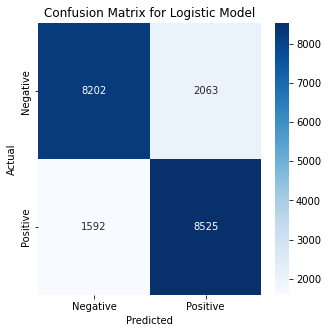

In [0]:

recall_values.append(evaluate(results,"Target","Logistic Model"))

### Linear SVC model

In [0]:
from pyspark.ml.classification import LinearSVC
from pyspark.ml.feature import StandardScaler

In [0]:
assembler = VectorAssembler(
    inputCols=[
        "Age",
        "Workclass_index",
        "Education_index",
        "Marital_Status_index",
        "Occupation_index",
        "Relationship_index",
        "Race_index",
        "Sex_index",
        "Capital_Gain",
        "Capital_Loss",
        "Hours_Per_Week",
        "Native_Country_index"
    ],
    outputCol="unscaled_features"
)

Standard scaler is used to scale the data for the linear SVC to perform well on the training data

In [0]:
scaler = StandardScaler(inputCol="unscaled_features",outputCol="features")

Create an object for the Linear SVC model

In [0]:
svc_model = LinearSVC(labelCol='Target')

Pipeline is used to pass the data through indexer and assembler simultaneously. Also, it helps to pre-rocess the test data in the same way as that of the train data.

In [0]:
pipe = Pipeline(
    stages=[
        Workclass_indexer,
Education_indexer,
Marital_Status_indexer,
Occupation_indexer,
Race_indexer,
Relationship_indexer,
Sex_indexer,
Native_Country_indexer,
    assembler,
        scaler,svc_model
    ]
)

Fit the model on the training data

In [0]:
train_data.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- Workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- Education: string (nullable = true)
 |-- Education_Num: integer (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- Relationship: string (nullable = true)
 |-- Race: string (nullable = true)
 |-- Sex: string (nullable = true)
 |-- Capital_Gain: integer (nullable = true)
 |-- Capital_Loss: integer (nullable = true)
 |-- Hours_Per_Week: integer (nullable = true)
 |-- Native_Country: string (nullable = true)
 |-- Target: integer (nullable = false)



In [0]:
test_data.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- Workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- Education: string (nullable = true)
 |-- Education_Num: integer (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- Relationship: string (nullable = true)
 |-- Race: string (nullable = true)
 |-- Sex: string (nullable = true)
 |-- Capital_Gain: integer (nullable = true)
 |-- Capital_Loss: integer (nullable = true)
 |-- Hours_Per_Week: integer (nullable = true)
 |-- Native_Country: string (nullable = true)
 |-- Target: integer (nullable = false)



In [0]:
%time

fit_model=pipe.fit(train_data)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


Store the results in a dataframe

In [0]:
results = fit_model.transform(test_data)
display(results)

Age,Workclass,fnlwgt,Education,Education_Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Target,Workclass_index,Education_index,Marital_Status_index,Occupation_index,Race_index,Relationship_index,Sex_index,Native_Country_index,unscaled_features,features,rawPrediction,prediction
17,Local-gov,192387,9th,5,Never-married,Other-service,Own-child,White,Male,0,0,45,United-States,0,2.0,11.0,1.0,5.0,0.0,2.0,0.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 2.0, 11.0, 1.0, 5.0, 2.0, 0.0, 0.0, 0.0, 0.0, 45.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 1.4433467394705337, 3.7022539423183063, 0.9658006837195434, 1.6602191177653982, 1.4786150373541882, 0.0, 0.0, 0.0, 0.0, 3.810543283558816, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(1.7285128853133787, -1.7285128853133787))",0.0
17,Local-gov,308901,11th,7,Never-married,Adm-clerical,Own-child,White,Female,0,0,15,United-States,0,2.0,7.0,1.0,4.0,0.0,2.0,1.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 2.0, 7.0, 1.0, 4.0, 2.0, 0.0, 1.0, 0.0, 0.0, 15.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 1.4433467394705337, 2.355979781475286, 0.9658006837195434, 1.3281752942123186, 1.4786150373541882, 0.0, 2.2635402678940957, 0.0, 0.0, 1.2701810945196053, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(2.405287841146234, -2.405287841146234))",0.0
17,Private,27415,11th,7,Never-married,Handlers-cleaners,Own-child,Amer-Indian-Eskimo,Male,0,0,20,United-States,0,0.0,7.0,1.0,8.0,3.0,2.0,0.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 0.0, 7.0, 1.0, 8.0, 2.0, 3.0, 0.0, 0.0, 0.0, 20.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 0.0, 2.355979781475286, 0.9658006837195434, 2.6563505884246372, 1.4786150373541882, 5.094959486468766, 0.0, 0.0, 0.0, 1.693574792692807, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(3.0793250729688886, -3.0793250729688886))",0.0
17,Private,34019,11th,7,Never-married,Other-service,Own-child,White,Male,0,0,20,United-States,0,0.0,7.0,1.0,5.0,0.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 12, indices -> List(0, 2, 3, 4, 5, 10), values -> List(17.0, 7.0, 1.0, 5.0, 2.0, 20.0))","Map(vectorType -> sparse, length -> 12, indices -> List(0, 2, 3, 4, 5, 10), values -> List(1.3476839716025555, 2.355979781475286, 0.9658006837195434, 1.6602191177653982, 1.4786150373541882, 1.693574792692807))","Map(vectorType -> dense, length -> 2, values -> List(2.362740636202295, -2.362740636202295))",0.0
17,Private,40432,10th,6,Never-married,Adm-clerical,Own-child,White,Female,0,0,4,United-States,0,0.0,8.0,1.0,4.0,0.0,2.0,1.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 0.0, 8.0, 1.0, 4.0, 2.0, 0.0, 1.0, 0.0, 0.0, 4.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 0.0, 2.692548321686041, 0.9658006837195434, 1.3281752942123186, 1.4786150373541882, 0.0, 2.2635402678940957, 0.0, 0.0, 0.33871495853856143, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(2.884273373793225, -2.884273373793225))",0.0
17,Private,41865,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Female,0,0,5,United-States,0,0.0,0.0,1.0,4.0,0.0,2.0,1.0,0.0,"Map(vectorType -> sparse, length -> 12, indices -> List(0, 3, 4, 5, 7, 10), values -> List(17.0, 1.0, 4.0, 2.0, 1.0, 5.0))","Map(vectorType -> sparse, length -> 12, indices -> List(0, 3, 4, 5, 7, 10), values -> List(1.3476839716025555, 0.9658006837195434, 1.3281752942123186, 1.4786150373541882, 2.2635402678940957, 0.42339369817320177))","Map(vectorType -> dense, length -> 2, values -> List(2.5075129044791, -2.5075129044791))",0.0
17,Private,53367,9th,5,Never-married,Other-service,Own-child,White,Female,0,0,35,United-States,0,0.0,11.0,1.0,5.0,0.0,2.0,1.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 0.0, 11.0, 1.0, 5.0, 2.0, 0.0

In [0]:
results.select(['Target','prediction']).show()

+------+----------+
|Target|prediction|
+------+----------+
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
+------+----------+
only showing top 20 rows



The area under the curve is 0.79 for model Linear SVC
The area under the PR curve is 0.7350161084446057 for model Linear SVC
The accuracy of the model is 0.7849573152781867 for model Linear SVC
Below is the confusion matrix: 
 [[7539 2726]
 [1657 8460]]
Accuracy: 0.78 for model Linear SVC
Precision: 0.76 for model Linear SVC
Recall: 0.84 for model Linear SVC
F1 Score: 0.79 for model Linear SVC


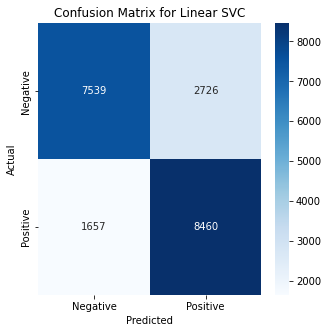

In [0]:

recall_values.append(evaluate(results,"Target","Linear SVC"))

# MLP Classifier model

In [0]:
from pyspark.ml.classification import MultilayerPerceptronClassifier

mlp_model = MultilayerPerceptronClassifier().\
        setLabelCol("Target").\
        setFeaturesCol("features").\
        setSeed(20).\
        setLayers([12, 16, 16, 8]) # the 6 is the number of input columns - we need the first layer to be the same as the number of input columns




In [0]:
pipe = Pipeline(
    stages=[
        Workclass_indexer,
Education_indexer,
Marital_Status_indexer,
Occupation_indexer,
Race_indexer,
Relationship_indexer,
Sex_indexer,
Native_Country_indexer,
    assembler,
        scaler,mlp_model
    ]
)

In [0]:
%time

fit_model=pipe.fit(train_data)

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 10 µs


In [0]:
test_data.show(3)

+---+----------+------+---------+-------------+--------------+------------------+------------+-------------------+-------+------------+------------+--------------+--------------+------+
|Age| Workclass|fnlwgt|Education|Education_Num|Marital_Status|        Occupation|Relationship|               Race|    Sex|Capital_Gain|Capital_Loss|Hours_Per_Week|Native_Country|Target|
+---+----------+------+---------+-------------+--------------+------------------+------------+-------------------+-------+------------+------------+--------------+--------------+------+
| 17| Local-gov|192387|      9th|            5| Never-married|     Other-service|   Own-child|              White|   Male|           0|           0|            45| United-States|     0|
| 17| Local-gov|308901|     11th|            7| Never-married|      Adm-clerical|   Own-child|              White| Female|           0|           0|            15| United-States|     0|
| 17|   Private| 27415|     11th|            7| Never-married| Handler

In [0]:
train_data.show(3)

+---+------------+------+---------+-------------+--------------+--------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
|Age|   Workclass|fnlwgt|Education|Education_Num|Marital_Status|    Occupation|  Relationship|               Race|    Sex|Capital_Gain|Capital_Loss|Hours_Per_Week|Native_Country|Target|
+---+------------+------+---------+-------------+--------------+--------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
| 17| Federal-gov| 29078|     11th|            7| Never-married|  Adm-clerical|     Own-child| Amer-Indian-Eskimo| Female|           0|           0|            15| United-States|     0|
| 17| Federal-gov| 99893|     11th|            7| Never-married|  Adm-clerical| Not-in-family|              Black| Female|           0|        1602|            40| United-States|     0|
| 17|   Local-gov| 39815|     10th|            6| Never-married| Other

In [0]:
results = fit_model.transform(test_data)
display(results)


Age,Workclass,fnlwgt,Education,Education_Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Target,Workclass_index,Education_index,Marital_Status_index,Occupation_index,Race_index,Relationship_index,Sex_index,Native_Country_index,unscaled_features,features,rawPrediction,probability,prediction
17,Local-gov,192387,9th,5,Never-married,Other-service,Own-child,White,Male,0,0,45,United-States,0,2.0,11.0,1.0,5.0,0.0,2.0,0.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 2.0, 11.0, 1.0, 5.0, 2.0, 0.0, 0.0, 0.0, 0.0, 45.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 1.4433467394705337, 3.7022539423183063, 0.9658006837195434, 1.6602191177653982, 1.4786150373541882, 0.0, 0.0, 0.0, 0.0, 3.810543283558816, 0.0))","Map(vectorType -> dense, length -> 8, values -> List(16.820703296819907, 11.75513697250463, -5.111192359209607, -3.614608143248932, -4.662762380736543, -3.2713694857076407, -4.555075435477179, -5.2969527423181875))","Map(vectorType -> dense, length -> 8, values -> List(0.9937292297559099, 0.006270765525418873, 2.9673365317607855E-10, 1.325333177798551E-9, 4.6464093488874807E-10, 1.868063887637013E-9, 5.174701640795367E-10, 2.4642915848958265E-10))",0.0
17,Local-gov,308901,11th,7,Never-married,Adm-clerical,Own-child,White,Female,0,0,15,United-States,0,2.0,7.0,1.0,4.0,0.0,2.0,1.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 2.0, 7.0, 1.0, 4.0, 2.0, 0.0, 1.0, 0.0, 0.0, 15.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 1.4433467394705337, 2.355979781475286, 0.9658006837195434, 1.3281752942123186, 1.4786150373541882, 0.0, 2.2635402678940957, 0.0, 0.0, 1.2701810945196053, 0.0))","Map(vectorType -> dense, length -> 8, values -> List(17.871310599091437, 10.739877395079407, -5.115590058156811, -3.8430153379888012, -4.638386276223044, -3.3199258307837667, -4.516594433336182, -5.533292964353294))","Map(vectorType -> dense, length -> 8, values -> List(0.9992010646660905, 7.989338084148848E-4, 1.0388881118782074E-10, 3.7088644003258446E-10, 1.6742324140468134E-10, 6.25771589428637E-10, 1.891077254948397E-10, 6.841679242801094E-11))",0.0
17,Private,27415,11th,7,Never-married,Handlers-cleaners,Own-child,Amer-Indian-Eskimo,Male,0,0,20,United-States,0,0.0,7.0,1.0,8.0,3.0,2.0,0.0,0.0,"Map(vectorType -> dense, length -> 12, values -> List(17.0, 0.0, 7.0, 1.0, 8.0, 2.0, 3.0, 0.0, 0.0, 0.0, 20.0, 0.0))","Map(vectorType -> dense, length -> 12, values -> List(1.3476839716025555, 0.0, 2.355979781475286, 0.9658006837195434, 2.6563505884246372, 1.4786150373541882, 5.094959486468766, 0.0, 0.0, 0.0, 1.693574792692807, 0.0))","Map(vectorType -> dense, length -> 8, values -> List(19.326332948546774, 10.268586406966145, -5.53483841718908, -4.185558402834944, -4.747429471433569, -3.3872346168228384, -4.971592753944074, -5.92378604443967))","Map(vectorType -> dense, length -> 8, values -> List(0.9998835281037133, 1.1647160829751386E-4, 1.5954377955121188E-11, 6.149853084741181E-11, 3.506285181838601E-11, 1.3663827039982938E-10, 2.8021692286755237E-11, 1.0813395009338376E-11))",0.0
17,Private,34019,11th,7,Never-married,Other-service,Own-child,White,Male,0,0,20,United-States,0,0.0,7.0,1.0,5.0,0.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 12, indices -> List(0, 2, 3, 4, 5, 10), values -> List(17.0, 7.0, 1.0, 5.0, 2.0, 20.0))","Map(vectorType -> sparse, length -> 12, indices -> List(0, 2, 3, 4, 5, 10), values -> List(1.3476839716025555, 2.355979781475286, 0.9658006837195434, 1.6602191177653982, 1.4786150373541882, 1.693574792692807))","Map(vectorType -> dense, length -> 8, values -> List(18.326513803014738, 10.534880750949721, -5.296944024752839, -3.9562439356241925, -4.627849008662509, -3.317931520660772, -4.700880474639612, -5.644851978396386))","Map(vectorType -> dense, length -> 8, values -> List(0.9995869921443423, 4.130069466239806E-4, 5.4989936457681506E-11, 2.1015603615612332E-10, 1.

In [0]:
results.select(['Target','prediction']).show()

+------+----------+
|Target|prediction|
+------+----------+
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
+------+----------+
only showing top 20 rows



The area under the curve is 0.81 for model Linear MLP
The area under the PR curve is 0.7639898280656241 for model Linear MLP
The accuracy of the model is 0.8143950544598175 for model Linear MLP
Below is the confusion matrix: 
 [[7842 2423]
 [1360 8757]]
Accuracy: 0.81 for model Linear MLP
Precision: 0.78 for model Linear MLP
Recall: 0.87 for model Linear MLP
F1 Score: 0.82 for model Linear MLP


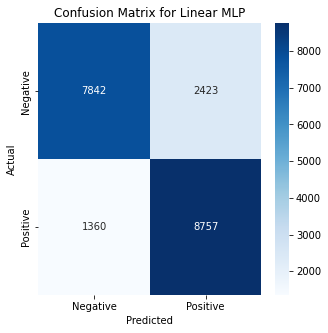

In [0]:
recall_values.append(evaluate(results,"Target","Linear MLP"))

# Decision Tree

In [0]:
from pyspark.ml.classification import DecisionTreeClassifier


In [0]:
assembler = VectorAssembler(
    inputCols=[
        "Age",
        "Workclass_index",
        "Education_index",
        "Marital_Status_index",
        "Occupation_index",
        "Relationship_index",
        "Race_index",
        "Sex_index",
        "Capital_Gain",
        "Capital_Loss",
        "Hours_Per_Week",
        "Native_Country_index"
    ],
    outputCol="features"
)

In [0]:
dt_model = DecisionTreeClassifier(labelCol='Target',maxBins=5000)

In [0]:
pipe = Pipeline(
    stages=[
        Workclass_indexer,
Education_indexer,
Marital_Status_indexer,
Occupation_indexer,
Race_indexer,
Relationship_indexer,
Sex_indexer,
Native_Country_indexer,
    assembler,
        dt_model
    ]
)

In [0]:
fit_model=pipe.fit(train_data)

In [0]:
results = fit_model.transform(test_data)

In [0]:
results.select(['Target','prediction']).show()

+------+----------+
|Target|prediction|
+------+----------+
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
|     0|       0.0|
+------+----------+
only showing top 20 rows



The area under the curve is 0.81 for model Decision Tree
The area under the PR curve is 0.7506245685476747 for model Decision Tree
The accuracy of the model is 0.8072809341575901 for model Decision Tree
Below is the confusion matrix: 
 [[7566 2699]
 [1229 8888]]
Accuracy: 0.81 for model Decision Tree
Precision: 0.77 for model Decision Tree
Recall: 0.88 for model Decision Tree
F1 Score: 0.82 for model Decision Tree


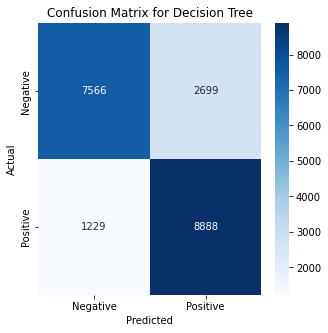

In [0]:
recall_values.append(evaluate(results,"Target","Decision Tree"))

In [0]:
recall_values

Out[461]: [0.8426410991400612,
 0.8362162696451517,
 0.8655727982603538,
 0.8785213007808639]

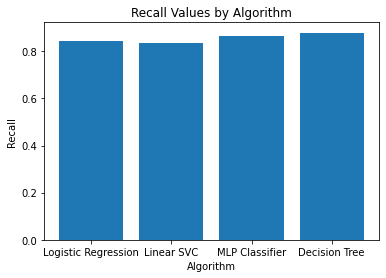

In [0]:
import matplotlib.pyplot as plt


algorithms = ['Logistic Regression', 'Linear SVC', 'MLP Classifier', 'Decision Tree']

# Create a bar chart of recall values
plt.bar(algorithms, recall_values)
plt.title('Recall Values by Algorithm')
plt.xlabel('Algorithm')
plt.ylabel('Recall')
plt.show()



# Observations:
- Using spark ml lib we have implemented various pre-processing steps to address the issue with data to formate data suitable for predictive analysis

- As we have a classification problem with binary target classifier  models like knn, Decision tree, and SVM, Logistic regression is best suited for predicting income category

- We have implemented logistic regression, Support vector machine, MLP classifier(Artificial Neural Network), and Decision tree.

- Based on the Business problem the false negative error incurs substantial law to the company so we want a matrix that minimizes the error which is the recall

# Conclusion
- Therefore among these models, we have chosen the decision tree(Unprune) to be the best for our business problem.

- There is scope to improve the recall score further using Hyper parameter tuning and unsampled technics which required immerses processing power or running spark in cluster mode which we plan to do in future